## Install essential libraries

In [1]:
import  os
import time
import pandas as pd
import requests #help us to save particular page in html
import csv
import sys
import seaborn as sns
import numpy as np

## Web Srapping

In [2]:
import sys
def retrieve_html():
    for year in range(2013, 2020):
        for month in range(1, 13):
            if(month < 10):
                url = 'https://en.tutiempo.net/climate/0{}-{}/ws-421820.html'.format(month, year)
            else:
                url = 'https://en.tutiempo.net/climate/{}-{}/ws-421820.html'.format(month, year)
                
            source_texts = requests.get(url)
            #while retreiving we also need to have utf encoding because there are some characters in html
            #that we need to fix
            text_utf = source_texts.text.encode('utf-8')

            #creating new folder system
            if not os.path.exists("/home/subarna/Documents/ML/Data/Html_data/{}".format(year)):
                os.makedirs("/home/subarna/Documents/ML/Data/Html_data/{}".format(year))
            with open("/home/subarna/Documents/ML/Data/Html_data/{}/{}.html".format(year,month),"wb") as output:
                output.write(text_utf)

        sys.stdout.flush() #gonna flush whatever is created here

In [3]:
#starting point
if __name__ == "__main__":
    start_time = time.time()
    retrieve_html()
    stop_time = time.time()
    print("time taken {}".format(stop_time - start_time))

time taken 153.6494061946869


## function to find out average of one day

In [5]:
def avg_data(year):
    average = []
    for rows in pd.read_csv('Data/AQI/aqi' + str(year) +'.csv',chunksize=24):
        add_var = 0
        avg = 0.0
        data = []
        df = pd.DataFrame(data= rows)
        for index, row in df.iterrows():
            data.append(row['PM2.5'])
        for i in data:
            if type(i) is float or type(i) is int:
                add_var = add_var +i
            elif type(i) is str:
                if i != 'NoData' and i != 'PwrFail' and i != '---' and i != 'InVld': #removing unwanted
                    temp = float(i)
                    add_var = add_var + temp
        avg = add_var/24
        
        average.append(avg)
    return average

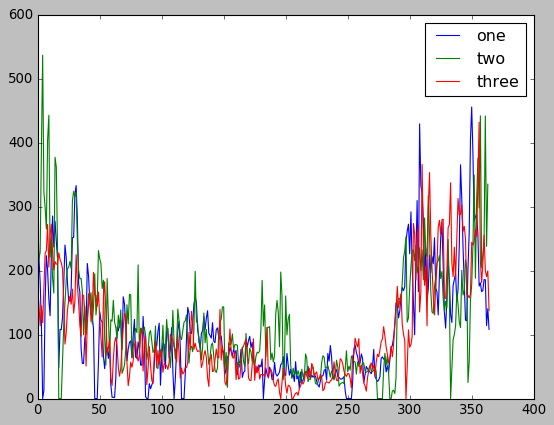

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('classic')
lst2013 = avg_data(2013)
lst2014 = avg_data(2014)
lst2015 = avg_data(2015)
plt.plot(range(0, 365), lst2013, label = 'one')
plt.plot(range(0, 364), lst2014, label = 'two')
plt.plot(range(0, 365), lst2015, label = 'three')
plt.legend(loc = 'best')
plt.show()

Winter inversion, valley effect in addition to industrial emissions, vehicular emissions are some of the reasons for the increasing amount of air pollution in winter. Dust storms, crop fires, burning of solid fuels for heating, as well as firecracker-related pollution during Diwali also increases winter pollution.

In [7]:
from bs4 import BeautifulSoup #beautiful soup is used for getting data out of html, xml, and other markup language

DataSet Details:

T	Average annual temperature

TM	Annual average maximum temperature

Tm	Average annual minimum temperature

PP	Rain or snow precipitation total annual

V	Annual average wind speed

RA	Number of days with rain

SN	Number of days with snow

TS	Number of days with storm

FG	Number of foggy days

TN	Number of days with tornado

GR	Number of days with hail

## extracting all independent features

In [8]:
def meta_data(month, year):
    file_html = open('Data/Html_data/{}/{}.html'.format(year, month), 'rb')
    plain_text = file_html.read() # consists all information of html filw
    
    tempD = []
    finalD = []
    
    #extracting all field values
    soup = BeautifulSoup(plain_text, "lxml")
    for table in soup.findAll('table', {'class': 'medias mensuales numspan'}):
        for tbody in table:
            for tr in tbody:
                a = tr.get_text()
                tempD.append(a)
                
    rows = len(tempD)/15
    
    for times in range(round(rows)):
        newtempD = []
        for i in range(15):
            newtempD.append(tempD[0])
            tempD.pop(0)
        finalD.append(newtempD)
        
    length = len(finalD)
    
    finalD.pop(length-1)
    finalD.pop(0)
    
    #droping unrequired features
    for a in range(len(finalD)):
        finalD[a].pop(14)
        finalD[a].pop(13)
        finalD[a].pop(12)
        finalD[a].pop(11)
        finalD[a].pop(10)
        finalD[a].pop(6)
        finalD[a].pop(0)  
        
    return finalD

In [10]:
#combining all csv files to one
def data_combine(year, cs):
    for a in pd.read_csv('Data/Real_data/real_' + str(year) + '.csv', chunksize= cs):
        df = pd.DataFrame(data =a)
        mylist = df.values.tolist()
    return mylist

## Preparing our data file

In [11]:
if __name__ == "__main__":
    if not os.path.exists("Data/Real_data"):
        os.makedirs("Data/Real_data")
    for year in range(2013, 2019):
        final_data = []
        with open("Data/Real_data/real_" + str(year) + '.csv', 'w') as csvfile:
            wr = csv.writer(csvfile, dialect ='excel')
            wr.writerow([
                'T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'
            ])
        for month in range(1, 13):
            temp = meta_data(month, year)
            final_data = final_data + temp
            
        pm = avg_data(year)#dynamic way to call attributes
        
        if len(pm) == 364:
            pm.insert(364, '-')
            
        for i in range(0, len(final_data)-1):
            final_data[i].insert(8, pm[i])
            
        with open('Data/Real_data/real_' + str(year) + '.csv', 'a') as csvfile:
            wr = csv.writer(csvfile, dialect ='excel')
            for row in final_data:
                flag = 0
                for elem in row:
                    if elem == "" or elem == "-":
                        flag = 1
                if flag != 1:
                    wr.writerow(row)
                    
    data_2013 = data_combine(2013, 400)
    data_2014 = data_combine(2014, 400)
    data_2015 = data_combine(2015, 400)
    data_2016 = data_combine(2016, 400)
    data_2017 = data_combine(2017, 400)
    data_2018 = data_combine(2018, 400)
    
    total = data_2013 + data_2014 + data_2015 + data_2016 + data_2017 + data_2018
    
    with open('Data/Real_data/Real_combine.csv', 'w') as csvfile:
        wr = csv.writer(csvfile, dialect ='excel')
        wr.writerow([
                'T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'
            ])
        wr.writerows(total)

In [13]:
df = pd.read_csv('Data/Real_data/Real_combine.csv')

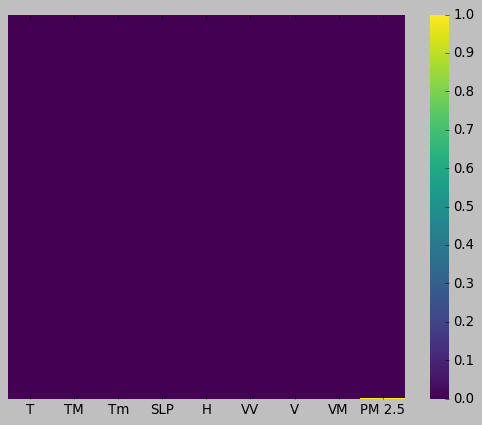

In [14]:
# check for null values
sns.heatmap(df.isnull(), yticklabels=False, cbar=True, cmap='viridis')

In [15]:
df.isnull()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
1085,False,False,False,False,False,False,False,False,False
1086,False,False,False,False,False,False,False,False,False
1087,False,False,False,False,False,False,False,False,False
1088,False,False,False,False,False,False,False,False,False


In [16]:
df = df.dropna()

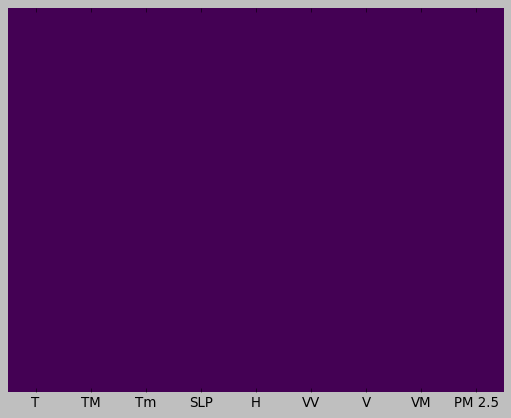

In [17]:
# check for null values
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [18]:
x = df.iloc[:, :-1] ## independent features
y = df.iloc[:,-1] ## dependent features

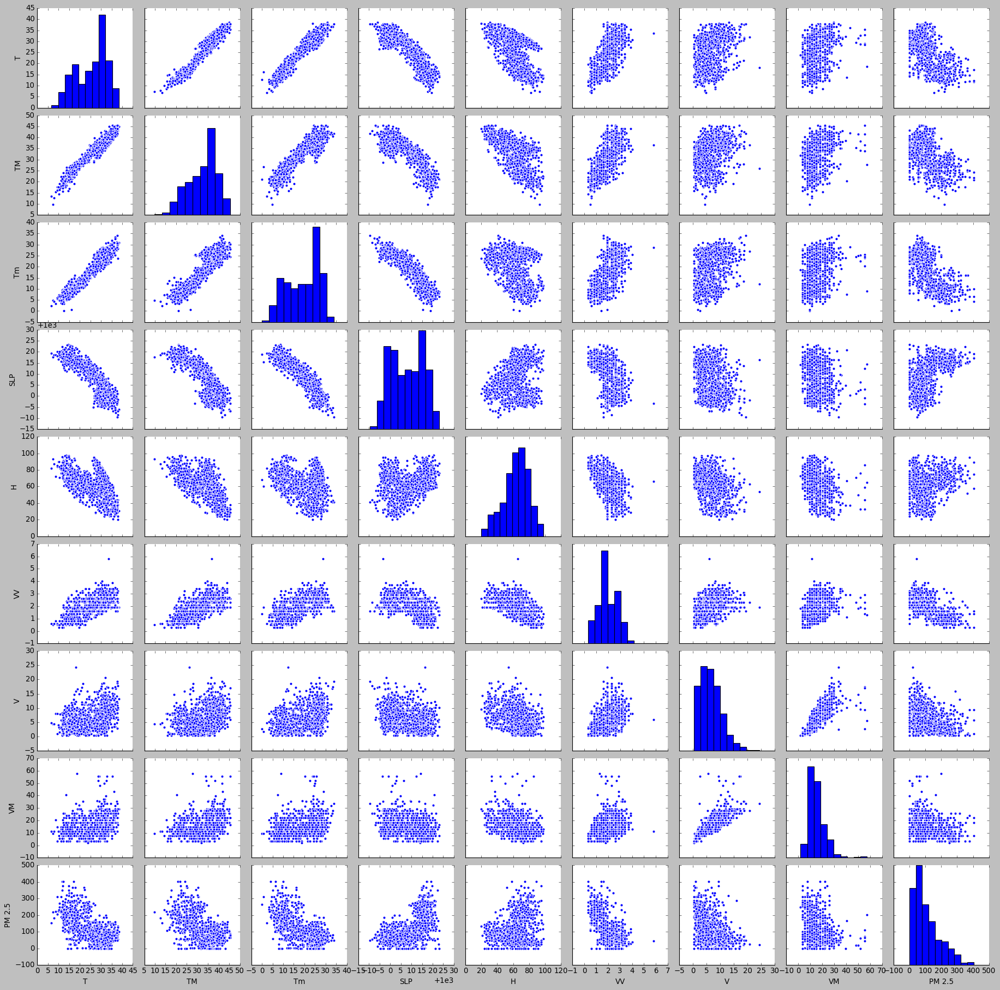

In [19]:
sns.pairplot(df)

In [20]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.963416,0.957227,-0.883207,-0.488919,0.625547,0.320218,0.276548,-0.629693
TM,0.963416,1.000000,0.889979,-0.826008,-0.576799,0.598727,0.303218,0.285671,-0.565459
Tm,0.957227,0.889979,1.000000,-0.912333,-0.275047,0.547490,0.312165,0.244408,-0.661733
SLP,-0.883207,-0.826008,-0.912333,1.000000,0.231971,-0.483494,-0.325862,-0.269129,0.605637
H,-0.488919,-0.576799,-0.275047,0.231971,1.000000,-0.489597,-0.356241,-0.368694,0.166577
VV,0.625547,0.598727,0.547490,-0.483494,-0.489597,1.000000,0.369851,0.325963,-0.593327
V,0.320218,0.303218,0.312165,-0.325862,-0.356241,0.369851,1.000000,0.780952,-0.327917
VM,0.276548,0.285671,0.244408,-0.269129,-0.368694,0.325963,0.780952,1.000000,-0.262848
PM 2.5,-0.629693,-0.565459,-0.661733,0.605637,0.166577,-0.593327,-0.327917,-0.262848,1.000000


### heat map makes it very easy to identify which features are most related to the target variable

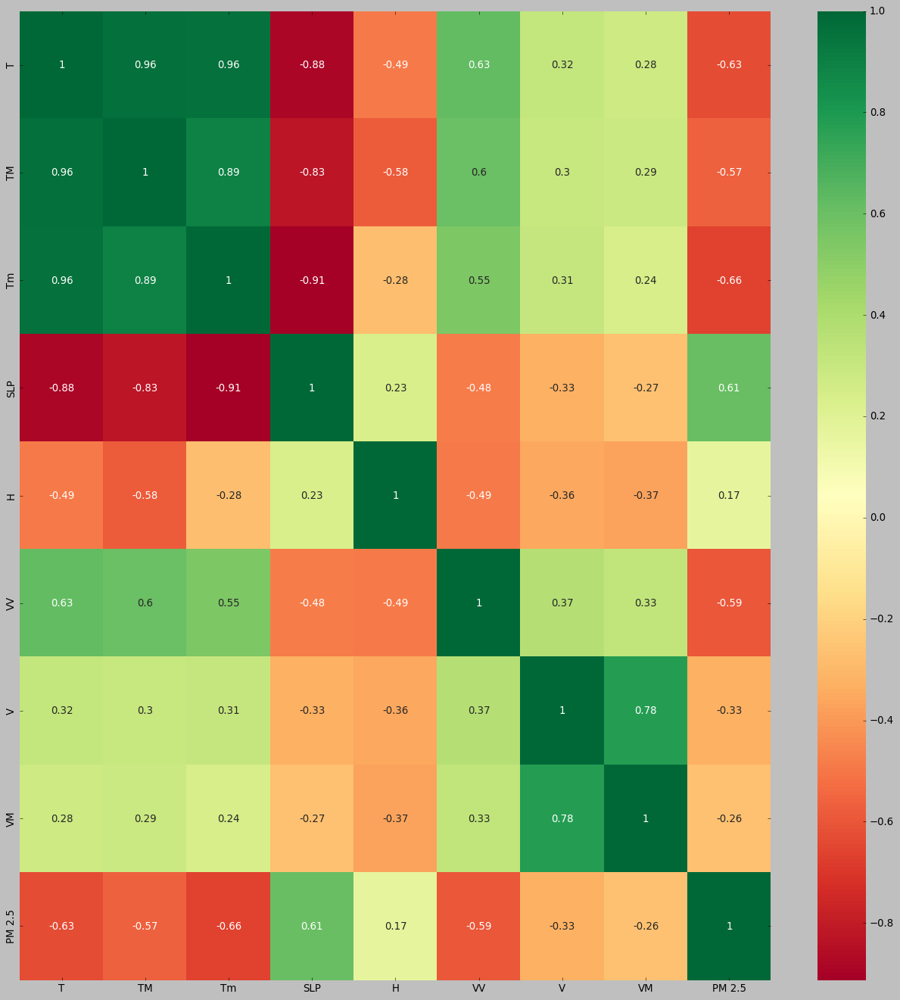

In [21]:
import matplotlib.pyplot as plt
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20, 20))
g = sns.heatmap(df[top_corr_features].corr(), annot = True, cmap = "RdYlGn")

### feature importance 
gives you score more important or relevant towards your output variable
feature importance is an inbuilt class that comes with tree based classifiers, we will be using extra tree regressor for extracting top 10 features for the dataset

In [22]:
from sklearn.ensemble import ExtraTreesRegressor #solves ouylier problem
model  = ExtraTreesRegressor()
model.fit(x,y)

ExtraTreesRegressor()

In [23]:
model.feature_importances_

array([0.17690092, 0.08404793, 0.20141759, 0.12263925, 0.07849149,
       0.23036108, 0.05938161, 0.04676014])

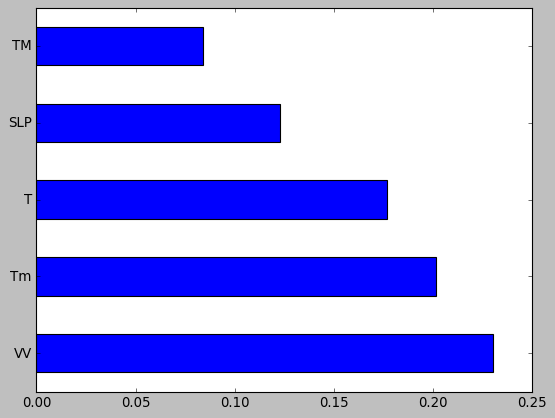

In [24]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index = x.columns)
feat_importances.nlargest(5).plot(kind = 'barh')
plt.show()

## Linear Regression

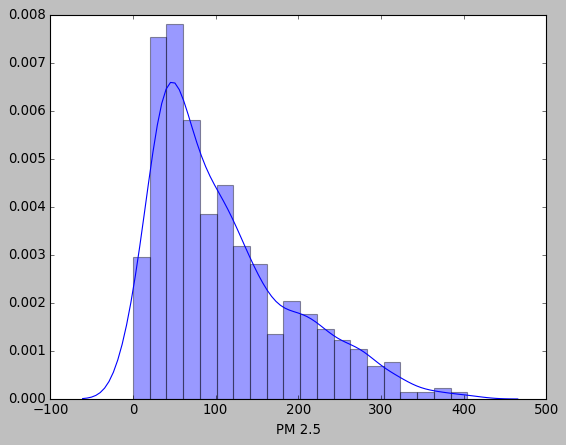

In [25]:
sns.distplot(y) #right skewwed data

In [26]:
#train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [31]:
from sklearn.linear_model import LinearRegression
regression = LinearRegression()
regression.fit(X_train, y_train)

LinearRegression()

In [30]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(regression, x, y, cv = 5)
score.mean()

0.4962057187240264

In [28]:
print("print R^2 coefficient of model: {}".format(regression.score(X_train, y_train)))
#Usually, the larger the R2, the better the regression model fits your observations.

print R^2 coefficient of model: 0.5424012569179388


In [29]:
print("print R^2 coefficient of model: {}".format(regression.score(X_test, y_test)))
#Usually, the larger the R2, the better the regression model fits your observations.

print R^2 coefficient of model: 0.5479181735684493


#### Normalization = x -xmin/ xmax – xmin   Zero Score Standardization = x - xmean/ xstd  
#### most algorithms will probably benefit from standardization more so than from normalization.
#### One disadvantage of normalization over standardization is that it loses some information in the data, especially about outliers.

In [32]:
regression.coef_

array([  0.60302872,   0.86898879,  -6.0103376 ,   0.18168593,
        -0.74824733, -43.4920176 ,  -2.22017186,  -0.13670174])

In [33]:
regression.intercept_

149.75183892346223

In [34]:
#model evaluation
coeff_df = pd.DataFrame(regression.coef_, x.columns, columns=['Coefficient'])
coeff_df

,Coefficient
T,0.603029
TM,0.868989
Tm,-6.010338
SLP,0.181686
H,-0.748247
VV,-43.492018
V,-2.220172
VM,-0.136702


Interpretation of coefficients:
    holding all other features fixed, an unit increase in T is associated with an increase of 0.603 in PM2.5
    holding all other features fixed, an unit increase in TM is associated with an increase of 0.8689 in PM2.5

In [35]:
prediction = regression.predict(X_test)

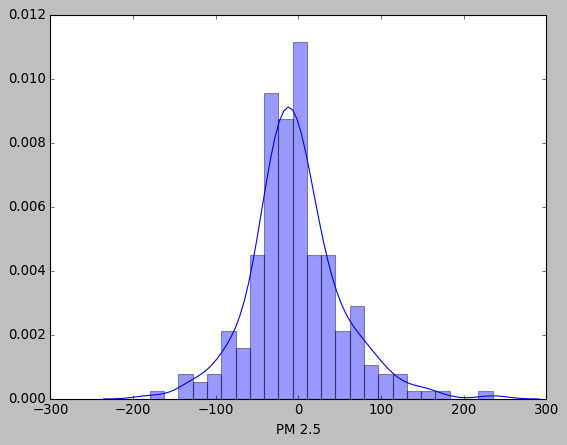

In [36]:
sns.distplot(y_test - prediction) #bell shape curve

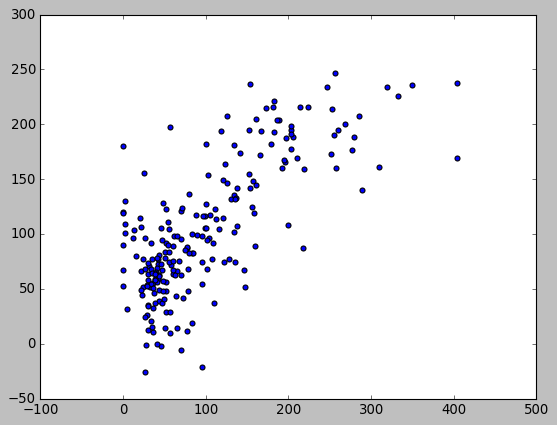

In [39]:
plt.scatter(y_test, prediction)

 regression evaluation metrics
 MAE, MSE, RMSE
 if we are getting bell curve and linear scatter plot we can say we are in right path

In [40]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 39.80440045494712
MSE: 3009.1523233092007
RMSE: 54.85574102415536


#### cope up with random state:
    Fix the random state from the start and don’t touch it!
    Use the prediction results as an interval
    Reduce imbalance/randomness in data split

In [41]:
from sklearn.externals import joblib
joblib.dump(regression, 'regeression_model.pkl')

/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


['regeression_model.pkl']

In [43]:
mse = cross_val_score(regression, x, y, scoring='neg_mean_squared_error')
mean_mse = np.mean(mse)
print(mean_mse)

-3363.347735049972


## ridge regression

In [42]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
ridge = Ridge()
parameters = {'alpha':[1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20]}

In [44]:
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv = 5)
ridge_regressor.fit(x, y)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20]},
             scoring='neg_mean_squared_error')

In [45]:
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

{'alpha': 20}
-3337.5974166398337


## lasso regression

In [47]:
from sklearn.linear_model import Lasso
lasso = Lasso()
parameters = {'alpha':[1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20, 30, 40, 45]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv = 5)
lasso_regressor.fit(x, y)
print(lasso_regressor.best_params_)
print(lasso_regressor.best_score_)

/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1340394.101149632, tolerance: 571.8423947559785
  positive)
/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1464256.6554720502, tolerance: 637.5176965354887
  positive)
/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1310190.951519095, tolerance: 585.8126775988605
  positive)
/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increas

{'alpha': 5}
-3319.5457569978767


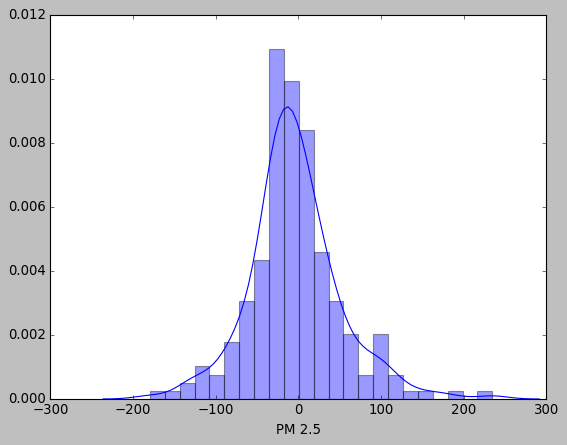

In [49]:
predic = lasso_regressor.predict(X_test)
sns.distplot(y_test-predic)

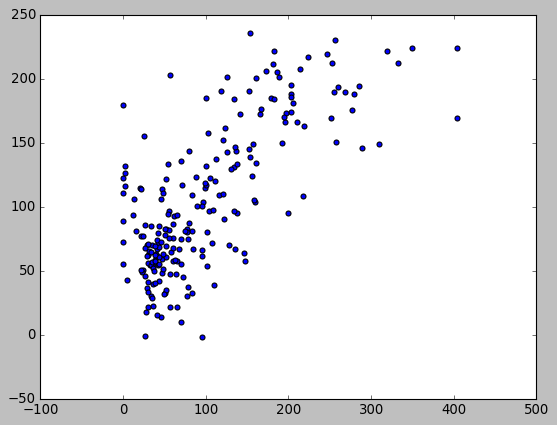

In [50]:
plt.scatter(y_test, predic)

In [51]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predic))
print('MSE:', metrics.mean_squared_error(y_test, predic))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predic)))
# performs very well when there are many different features

MAE: 40.291825007219316
MSE: 3087.511090481954
RMSE: 55.56537672401721


In [52]:
from sklearn.externals import joblib
joblib.dump(regression, 'lasso_reg_model.pkl')

['lasso_reg_model.pkl']

#### lasso regression is performing better than ridge

## decision tree

In [53]:
from sklearn.tree import DecisionTreeRegressor

In [54]:
tree = DecisionTreeRegressor(criterion= "mse")

In [55]:
score = cross_val_score(tree, x, y, cv = 5)
print(score.mean())

0.031353750323539445


In [57]:
tree.fit(X_train, y_train)
print("print R^2 coefficient of model: {}".format(tree.score(X_train, y_train)))
print("print R^2 coefficient of model: {}".format(tree.score(X_test, y_test)))

print R^2 coefficient of model: 1.0
print R^2 coefficient of model: 0.3045672791485259


## Tree Vizualization

In [58]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz

/home/subarna/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [59]:
import pydotplus

In [60]:
features = list(df.columns[:-1]) #export graphviz used to take list
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [61]:
dot_data=  StringIO()
export_graphviz(tree, out_file= dot_data, feature_names= features, filled = True, rounded= True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.712342 to fit



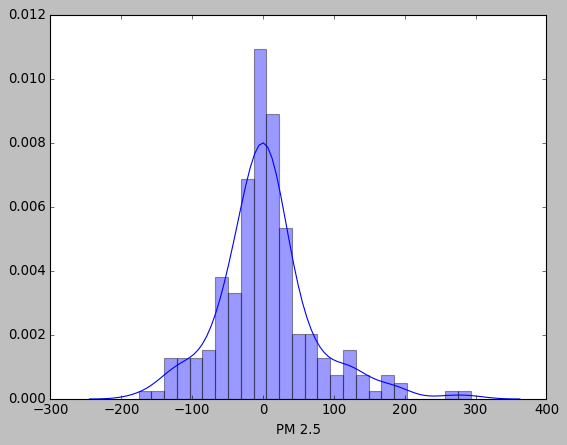

In [63]:
prediction = tree.predict(X_test)
sns.distplot(y_test - prediction)

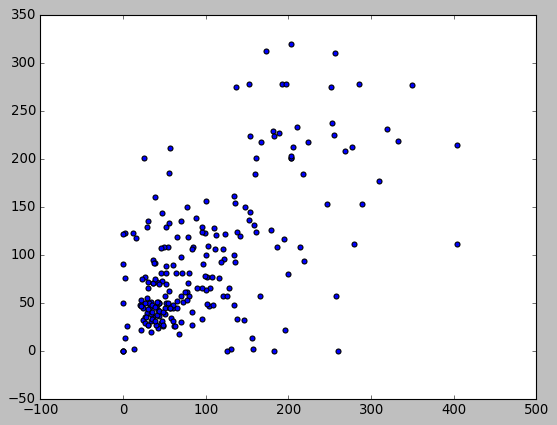

In [64]:
plt.scatter(y_test, prediction)

## Hyperparameter tuning decision tree

In [65]:
params = {
    "splitter" : ["best", "random"],
    "max_depth" : [3,4,5,6,8,10,12,15],
    "min_samples_leaf" : [1,2,3,4,5],
    "min_weight_fraction_leaf" : [0.1,0.2,0.3,0.4],
    "max_features" : ["auto", "log2", "sqrt", None],
    "max_leaf_nodes" : [None, 10,20,30,40,50,60,70]
}

In [66]:
g_search = GridSearchCV(tree, param_grid= params, scoring = "neg_mean_squared_error", n_jobs=-1, cv = 10, verbose = 2)

In [67]:
def timer(start_time = None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(),3600)
        tmon, tsec = divmod(temp_sec, 60)
        print("\n Time taken: {} hours {} minutes and {} seconds".format(thour, tmin, round(tsec, 2)))

In [68]:
from datetime import datetime
start_time = timer(None)
g_search.fit(x, y)
#timer(start_time)

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 956 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 2580 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 4844 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done 7764 tasks      | elapsed:   35.1s
[Parallel(n_jobs=-1)]: Done 11324 tasks      | elapsed:   50.1s
[Parallel(n_jobs=-1)]: Done 15540 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 20396 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 25908 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 32060 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 38868 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 46316 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 54420 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 63164 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 72564 t

NameError: name 'tmin' is not defined

In [69]:
g_search.best_params_

{'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': 50,
 'min_samples_leaf': 3,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [70]:
g_search.best_score_

-3316.3027477431124

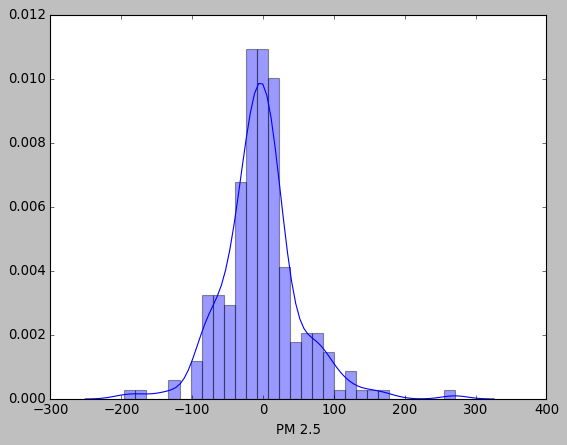

In [71]:
prediction = g_search.predict(X_test)
sns.distplot(y_test - prediction)

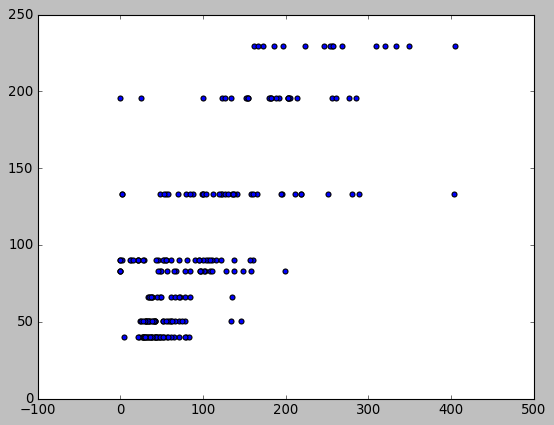

In [72]:
plt.scatter(y_test, prediction)

In [73]:
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))
# performs very well when there are many different features

MAE: 37.54821487079277
MSE: 2952.0826940988795
RMSE: 54.33307182645649


In [74]:
joblib.dump(g_search, 'tree.pkl')

['tree.pkl']

## Random Forest

In [75]:
from sklearn.ensemble import RandomForestRegressor

In [77]:
regressor = RandomForestRegressor()
score = cross_val_score(regressor, x,y, cv = 5)
score.mean()

0.48418778082702774

In [78]:
regressor.fit(X_train, y_train)
print("print R^2 coefficient of model: {}".format(regressor.score(X_train, y_train)))
print("print R^2 coefficient of model: {}".format(regressor.score(X_test, y_test)))

print R^2 coefficient of model: 0.9446543504255455
print R^2 coefficient of model: 0.5856544723497318


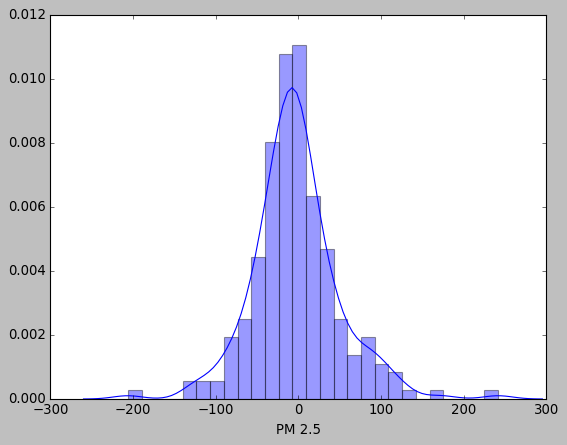

In [79]:
prediction = regressor.predict(X_test)
sns.distplot(y_test - prediction)

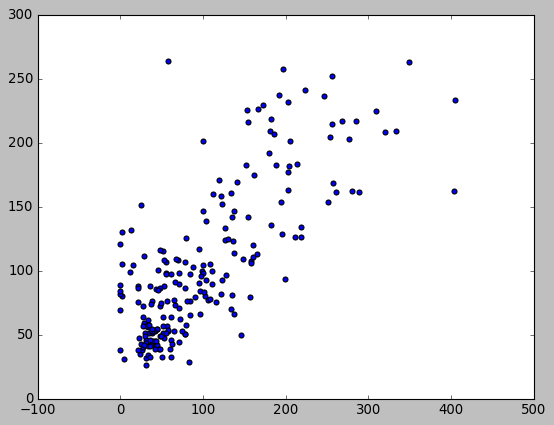

In [80]:
plt.scatter(y_test, prediction)

### Randomized Search CV

In [81]:
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


In [82]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]
# Method of selecting samples for training each tree
# bootstrap = [True, False]


In [83]:
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [84]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = regressor, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)

In [85]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  8.0min finished


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [86]:
rf_random.best_params_

{'n_estimators': 700,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 10}

In [87]:
rf_random.best_score_

-2693.7555071123243

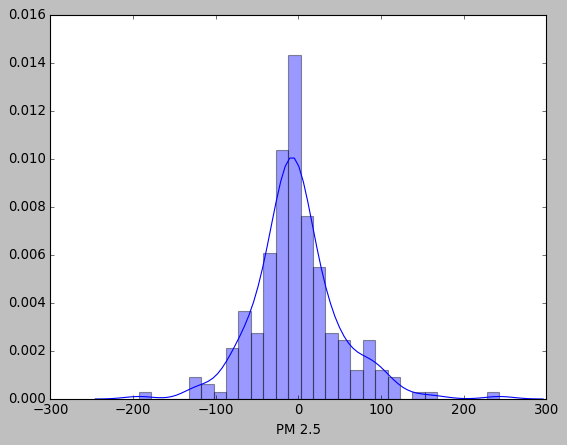

In [88]:
predictions=rf_random.predict(X_test)
sns.distplot(y_test-predictions)

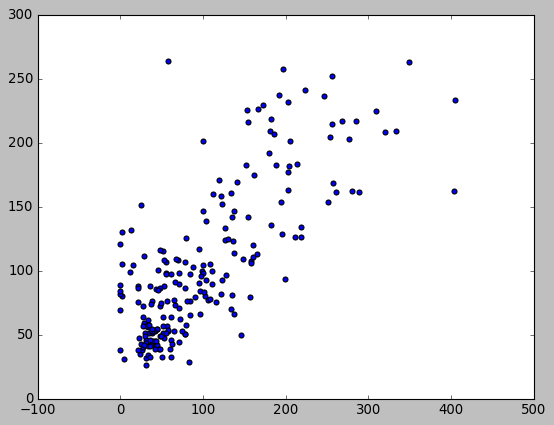

In [89]:
plt.scatter(y_test,prediction)

In [90]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 36.65821048491803
MSE: 2680.8351029714204
RMSE: 51.776781504564575


## Xgboost

In [93]:
import xgboost as xgb

In [96]:
xg_reg = xgb.XGBRegressor()
xg_reg.fit(X_train,y_train)
print("Coefficient of determination R^2 <-- on train set: {}".format(xg_reg.score(X_train, y_train)))
print("Coefficient of determination R^2 <-- on train set: {}".format(xg_reg.score(X_test, y_test)))

Coefficient of determination R^2 <-- on train set: 0.998295703706931
Coefficient of determination R^2 <-- on train set: 0.5450185504965851


In [97]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(xg_reg,x,y,cv=5)

In [98]:
score.mean()

0.3796341563666081

In [100]:
prediction=regressor.predict(X_test)

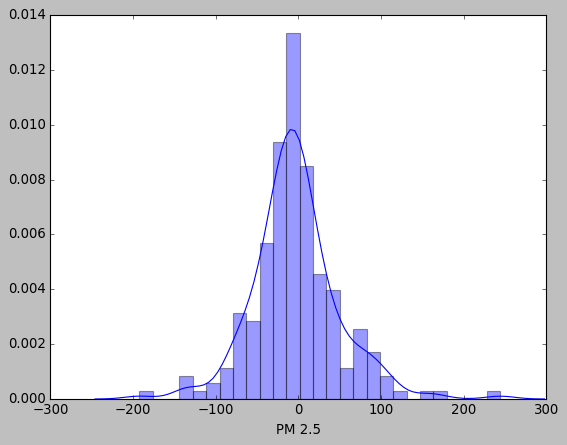

In [102]:
sns.distplot(y_test-prediction)

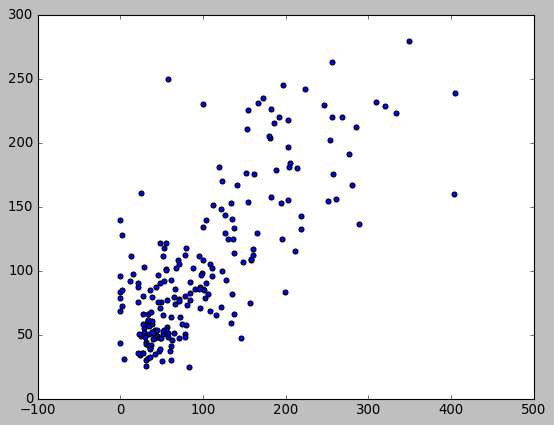

In [103]:
plt.scatter(y_test,prediction)

In [104]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


### Randomized Search CV

In [105]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Various learning rate parameters
learning_rate = ['0.05','0.1', '0.2','0.3','0.5','0.6']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
#Subssample parameter values
subsample=[0.7,0.6,0.8]
# Minimum child weight parameters
min_child_weight=[3,4,5,6,7]

In [106]:
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'learning_rate': learning_rate,
               'max_depth': max_depth,
               'subsample': subsample,
               'min_child_weight': min_child_weight}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'learning_rate': ['0.05', '0.1', '0.2', '0.3', '0.5', '0.6'], 'max_depth': [5, 10, 15, 20, 25, 30], 'subsample': [0.7, 0.6, 0.8], 'min_child_weight': [3, 4, 5, 6, 7]}


In [107]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
regressor=xgb.XGBRegressor()

In [108]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
xg_random = RandomizedSearchCV(estimator = regressor, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)

In [109]:
xg_random.fit(X_train,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  3.8min finished


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n...
                                          validate_parameters=None,
                                          verbosity=None),
                   n_iter=100, n_jobs=-1,
                   pa

In [110]:
xg_random.best_params_

{'subsample': 0.6,
 'n_estimators': 100,
 'min_child_weight': 6,
 'max_depth': 15,
 'learning_rate': '0.05'}

In [111]:
xg_random.best_score_

-2878.4735282374004

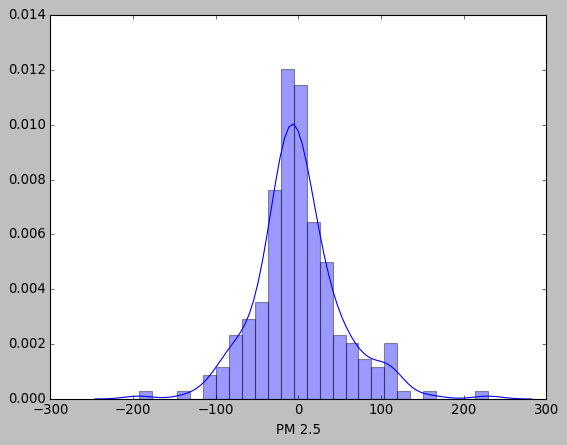

In [112]:
predictions=xg_random.predict(X_test)
sns.distplot(y_test-predictions)

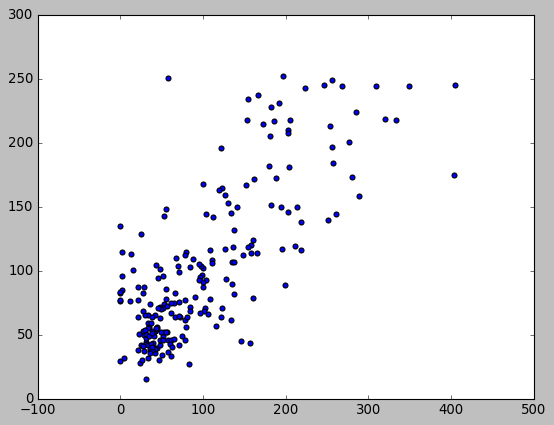

In [113]:
plt.scatter(y_test,predictions)

In [114]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 36.76680081918698
MSE: 2677.7987242509885
RMSE: 51.74745137928039


In [115]:
joblib.dump(g_search, 'xg.pkl')

['xg.pkl']

## KNN

In [116]:
from sklearn.neighbors import KNeighborsRegressor
regressor=KNeighborsRegressor(n_neighbors=1)
regressor.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=1)

In [117]:
print("Coefficient of determination R^2 <-- on train set: {}".format(regressor.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [118]:
print("Coefficient of determination R^2 <-- on train set: {}".format(regressor.score(X_test, y_test)))

Coefficient of determination R^2 <-- on train set: 0.252604944656611


In [120]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(regressor,x,y,cv=5)

In [121]:
score.mean()

-0.0925614653378894

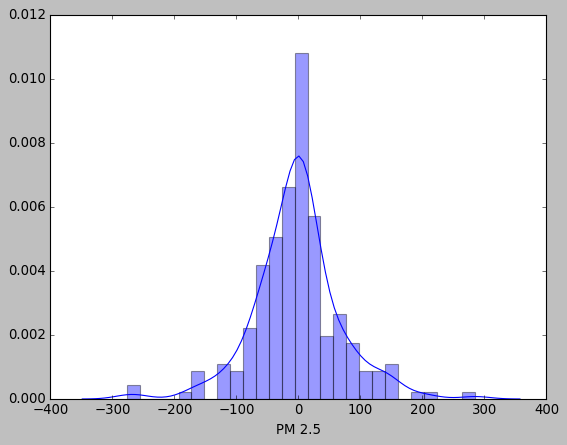

In [122]:
prediction=regressor.predict(X_test)
sns.distplot(y_test-prediction)

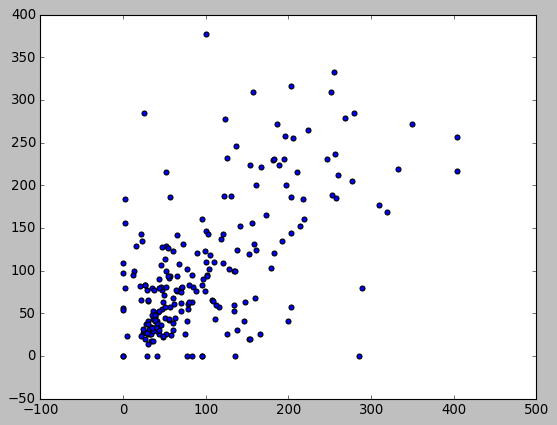

In [123]:
plt.scatter(y_test,prediction)

In [125]:
accuracy_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsRegressor(n_neighbors=i)
    score=cross_val_score(knn,x,y,cv=10,scoring="neg_mean_squared_error")
    accuracy_rate.append(score.mean())

Text(0, 0.5, 'Accuracy Rate')

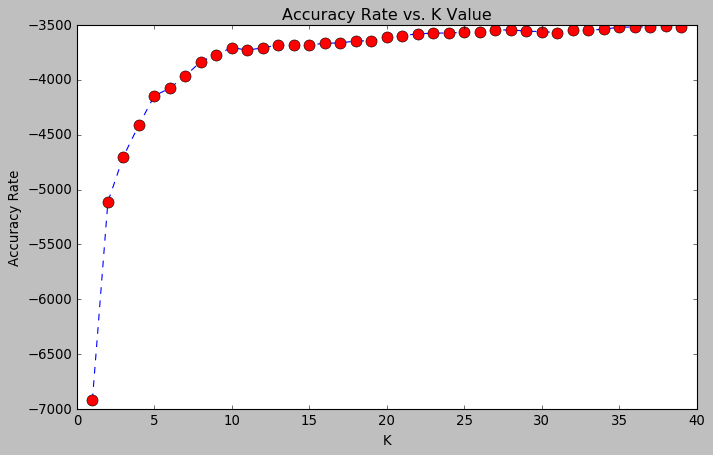

In [126]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
#plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
 #        markerfacecolor='red', markersize=10)
plt.title('Accuracy Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy Rate')

In [128]:
# FIRST A QUICK COMPARISON TO OUR ORIGINAL K=1
knn = KNeighborsRegressor(n_neighbors=40)

knn.fit(X_train,y_train)
predictions = knn.predict(X_test)

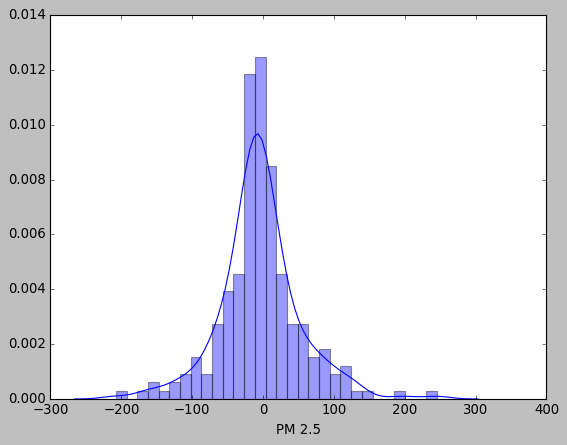

In [129]:
sns.distplot(y_test-predictions)

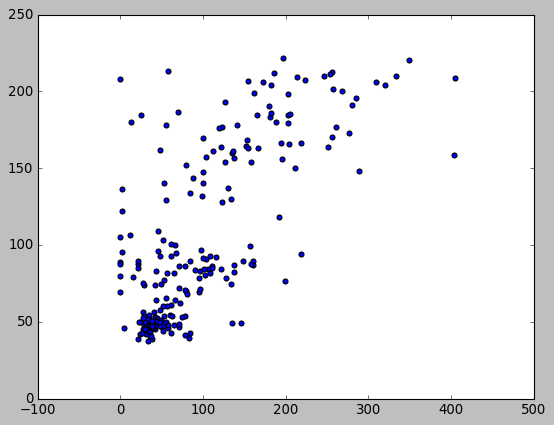

In [130]:
plt.scatter(y_test,predictions)

In [131]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 39.82004491590214
MSE: 3300.200158316808
RMSE: 57.44736859349441


## ANN

In [132]:

# Importing the Keras libraries and packages
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout

Using TensorFlow backend.


In [137]:
NN_model = Sequential()

# The Input Layer :
NN_model.add(Dense(128, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))

# The Hidden Layers :
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model.summary()

# Fitting the ANN to the Training set
model_history=NN_model.fit(X_train, y_train,validation_split=0.2, batch_size = 10, nb_epoch = 50)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 128)               1152      
_________________________________________________________________
dense_7 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_8 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_9 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 257       
Total params: 166,017
Trainable params: 166,017
Non-trainable params: 0
_________________________________________________________________


/home/subarna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.


Train on 696 samples, validate on 174 samples
Epoch 1/50
696/696 [==============================] - 4s 5ms/step - loss: 68.6659 - mean_absolute_error: 68.6659 - val_loss: 56.5041 - val_mean_absolute_error: 56.5041
Epoch 2/50
696/696 [==============================] - 1s 2ms/step - loss: 65.4946 - mean_absolute_error: 65.4946 - val_loss: 56.6716 - val_mean_absolute_error: 56.6716
Epoch 3/50
696/696 [==============================] - 2s 3ms/step - loss: 62.2053 - mean_absolute_error: 62.2053 - val_loss: 50.6284 - val_mean_absolute_error: 50.6284
Epoch 4/50
696/696 [==============================] - 1s 2ms/step - loss: 54.0376 - mean_absolute_error: 54.0376 - val_loss: 48.2871 - val_mean_absolute_error: 48.2871
Epoch 5/50
696/696 [==============================] - 1s 2ms/step - loss: 47.0921 - mean_absolute_error: 47.0921 - val_loss: 44.6860 - val_mean_absolute_error: 44.6860
Epoch 6/50
696/696 [==============================] - 1s 2ms/step - loss: 45.3898 - mean_absolute_error: 45.3898 -

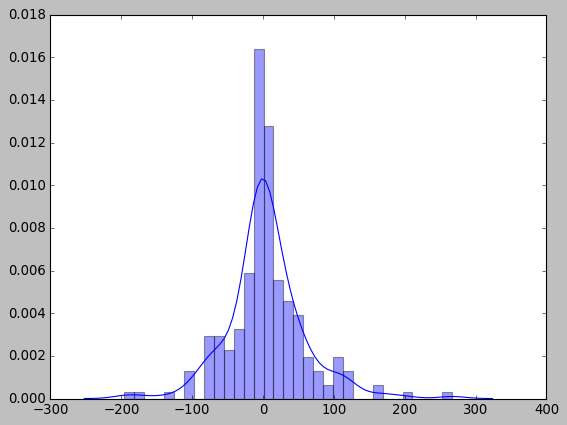

In [138]:
prediction=NN_model.predict(X_test)
sns.distplot(y_test.values.reshape(-1,1)-prediction)

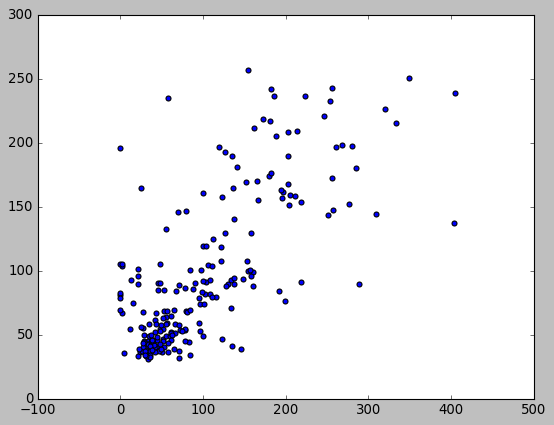

In [139]:
plt.scatter(y_test,prediction)

In [140]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 37.25597338486884
MSE: 3124.6211375503485
RMSE: 55.898310686015805
